## Introduction
This example will show the steps needed to build a convolutional neural network (CNN) to reconstruct a high-resolution version of an image given a low-resolution version.  The Efficient Sub-Pixel CNN (ESCPN) method [1] leverages efficient "sub-pixel convolution" layers, which learns an array of image upscaling filters.

This notebook improves upon the original work [2], achieving better results by:
- Using a larger dataset consisting of higher resolution images.
- Intelligently searching for optimal hyperparameters for the neural network.
- Adding an attention mechanism so the model learns key visual features.
- Training the best hyperparameters for 250 epochs.

[1] https://arxiv.org/abs/1609.05158
[2] https://keras.io/examples/vision/super_resolution_sub_pixel/
[3] http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_HR.zip
[4] https://en.wikipedia.org/wiki/YUV)
[5] https://en.wikipedia.org/wiki/Peak_signal-to-noise_ratio

In [86]:
import keras
import keras_tuner as kt
from keras import layers
from keras import ops
from keras.utils import load_img
from keras.utils import array_to_img
from keras.utils import img_to_array
from keras.preprocessing import image_dataset_from_directory

from tensorflow.keras.models import Sequential  # Create sequential layered neural networks
import tensorflow as tf  #  only for data preprocessing
from tensorflow.keras.optimizers import ( # Optimizers
    Adam,
    Adadelta,
    Lamb,
    RMSprop,
    SGD
)
from tensorflow.keras.layers import (
   Input,
   Conv2D,  # 2D convolutional layers for images
   LeakyReLU,  # Activation function layers
   MaxPooling2D,  # Maximum pooling layers
   Flatten,  # Flatten layers into 1D vectors
   Dense,  # Fully connected layer
   Dropout,  # Delete/ignore certain neurons to avoid overfitting
   BatchNormalization  # Normalize layer inputs for improved performance
)
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.utils import to_categorical  # One-hot encoder for categorical features
from tensorflow.keras.losses import CategoricalCrossentropy, SparseCategoricalCrossentropy  # Loss function
from tensorflow.keras.metrics import Accuracy  # Accuracy metric to evaluate model performance

import os
import math
import numpy as np
from IPython.display import display

### Download dataset

In [87]:
import os
import urllib.request
import zipfile

url = "http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_HR.zip"
file_path = "/content/DIV2K_train_HR.zip"
extract_path = "/content/DIV2K/"

if not os.path.exists(file_path):
    print("Downloading DIV2K dataset...")
    urllib.request.urlretrieve(url, file_path)

if not os.path.exists(extract_path):
    print("Extracting dataset...")
    with zipfile.ZipFile(file_path, 'r') as zip_ref:
        zip_ref.extractall(extract_path)

root_dir = "/content/DIV2K/"
print(f"Dataset ready at {root_dir}")

Extracting dataset...
Dataset ready at /Users/socrates/Documents/workspace/Tensorflow/data/DIV2K/



<br>
We create training and validation datasets via `image_dataset_from_directory`.<br>


In [88]:
crop_size = 300
upscale_factor = 3
input_size = crop_size // upscale_factor
batch_size = 8

In [89]:
train_ds = image_dataset_from_directory(
    root_dir,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="training",
    seed=420,
    label_mode=None,
)

Found 800 files.
Using 640 files for training.


In [90]:
valid_ds = image_dataset_from_directory(
    root_dir,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="validation",
    seed=420,
    label_mode=None,
)

Found 800 files.
Using 160 files for validation.



<br>
We rescale the images to take values in the range [0, 1].<br>


In [91]:
def scaling(input_image):
    input_image = input_image / 255.0
    return input_image

Scale from (0, 255) to (0, 1)

In [92]:
train_ds = train_ds.map(scaling)
valid_ds = valid_ds.map(scaling)


<br>
Let's visualize a few sample images:<br>


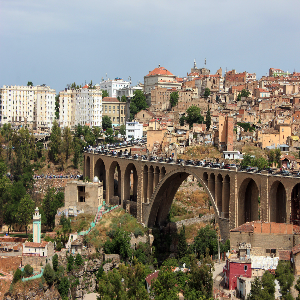

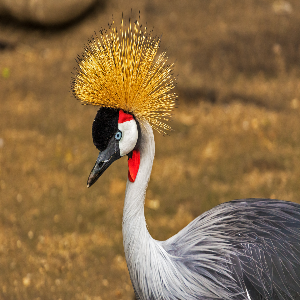

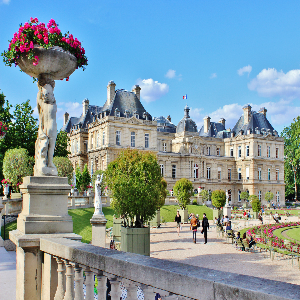

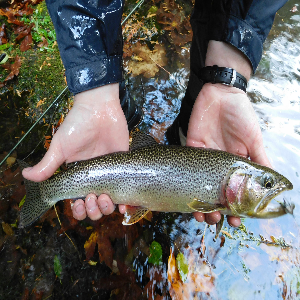

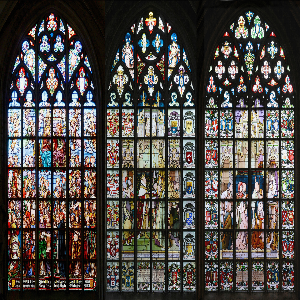

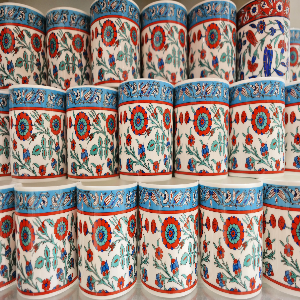

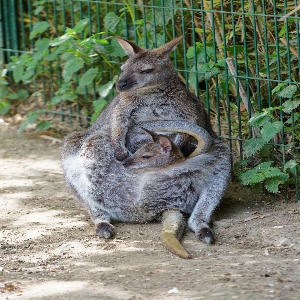

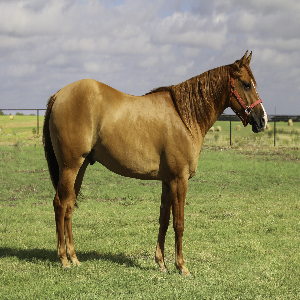

In [93]:
for batch in train_ds.take(1):
    for img in batch:
        display(array_to_img(img))

We prepare a dataset of test image paths that we will use for visual evaluation at the end of this example.

In [96]:
test_path = os.path.join(root_dir, "DIV2K_train_HR")

In [97]:
test_img_paths = sorted(
    [
        os.path.join(test_path, fname)
        for fname in os.listdir(test_path)
        if fname.endswith(".png")
    ]
)

## Data Augmentation
Let's process image data. First, we convert our images from the RGB color space to the YUV colour space.

For the input data (low-resolution images), we crop the image, retrieve the `y` channel (luninance), and resize it with the `area` method (use `BICUBIC` if you use PIL).

We only consider the luminance channel in the YUV color space because humans are more sensitive to luminance change.

For the target data (high-resolution images), we just crop the image and retrieve the `y` channel.

Flip and rotate images randomly.  Add Gaussian noise.

In [98]:
def process_input(input, input_size, upscale_factor):
    input = tf.image.rgb_to_yuv(input)
    last_dimension_axis = len(input.shape) - 1
    y, u, v = tf.split(input, 3, axis=last_dimension_axis)
    return tf.image.resize(y, [input_size, input_size], method="area")

In [99]:
def process_target(input):
    input = tf.image.rgb_to_yuv(input)
    last_dimension_axis = len(input.shape) - 1
    y, u, v = tf.split(input, 3, axis=last_dimension_axis)
    return y

In [100]:
def augment_image(input_img, target_img):
    # Random flip left-right
    if tf.random.uniform(()) > 0.5:
        input_img = tf.image.flip_left_right(input_img)
        target_img = tf.image.flip_left_right(target_img)

    # Random flip up-down
    if tf.random.uniform(()) > 0.5:
        input_img = tf.image.flip_up_down(input_img)
        target_img = tf.image.flip_up_down(target_img)

    # Random rotation (90, 180, 270 degrees)
    k = tf.random.uniform(shape=[], minval=0, maxval=4, dtype=tf.int32)
    input_img = tf.image.rot90(input_img, k)
    target_img = tf.image.rot90(target_img, k)

    # Add Gaussian noise (only to the input, not the target)
    noise = tf.random.normal(shape=tf.shape(input_img), mean=0.0, stddev=0.05, dtype=tf.float32)
    input_img = input_img + noise
    # Clip to valid range since noise might push values out of [0, 1] bounds
    # Assuming the images are scaled to [0,1] or YUV equivalent ranges before this

    # Note: Random cropping and scaling are trickier to implement synchronously
    # for both low-res and high-res pairs without breaking the scaling ratio.
    # For this ESPCN model, flipping and rotation are safe and standard.

    return input_img, target_img


Now let's apply this augmentation function to our `train_ds`.

In [101]:
train_ds = train_ds.map(
    lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)
train_ds = train_ds.prefetch(buffer_size=32)

In [102]:
try:
    train_ds = train_ds.map(
        lambda x, y: augment_image(x, y),
        num_parallel_calls=tf.data.AUTOTUNE
    )
    train_ds = train_ds.prefetch(buffer_size=tf.data.AUTOTUNE)
    print("Data augmentation applied to train_ds successfully.")
except NameError:
    print("Error: 'train_ds' is not defined. Please run the cells above that create and prepare the dataset first.")

Data augmentation applied to train_ds successfully.


In [103]:
valid_ds = valid_ds.map(
    lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)
valid_ds = valid_ds.prefetch(buffer_size=32)


<br>
Let's take a look at the input and target data.<br>


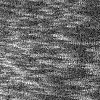

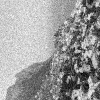

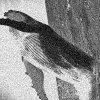

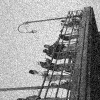

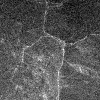

...

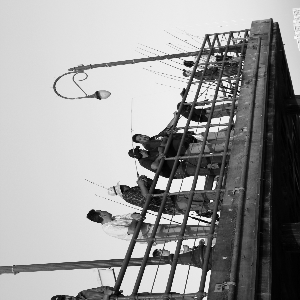

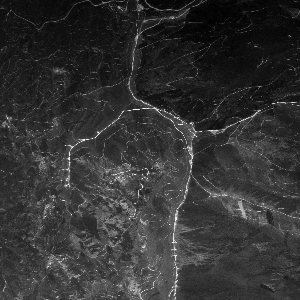

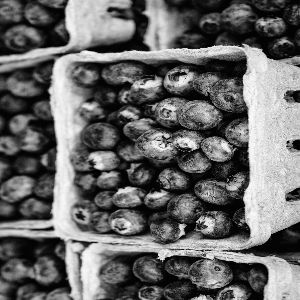

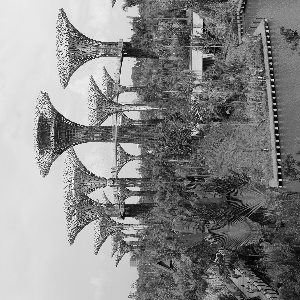

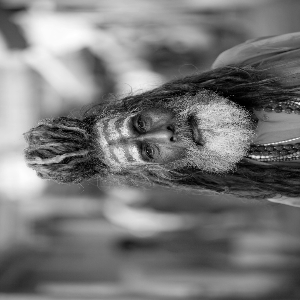

In [104]:
for batch in train_ds.take(1):
    for img in batch[0]:
        display(array_to_img(img))
    for img in batch[1]:
        display(array_to_img(img))


<br>
## Build a model<br>
Compared to the paper, we add one more layer and we use the `relu` activation function<br>
instead of `tanh`.<br>
It achieves better performance even though we train the model for fewer epochs.<br>


In [105]:
class DepthToSpace(layers.Layer):
    def __init__(self, block_size):
        super().__init__()
        self.block_size = block_size
    def call(self, input):
        batch, height, width, depth = ops.shape(input)
        depth = depth // (self.block_size**2)
        x = ops.reshape(
            input, [batch, height, width, self.block_size, self.block_size, depth]
        )
        x = ops.transpose(x, [0, 1, 3, 2, 4, 5])
        x = ops.reshape(
            x, [batch, height * self.block_size, width * self.block_size, depth]
        )
        return x

In [106]:
# Define perceptual losses globally so they are not rebuilt during hyperparameter tuning
vgg_model = tf.keras.applications.VGG19(include_top=False, weights='imagenet')
vgg_model.trainable = False
vgg_feature_extractor = tf.keras.Model(inputs=vgg_model.input, outputs=vgg_model.get_layer('block2_conv2').output)

def ssim_loss(y_true, y_pred):
    # Max val is 1.0 because we scaled our images between 0 and 1
    return 1.0 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val=1.0))

def vgg_loss(y_true, y_pred):
    # ESPCN handles 1-channel (Y). VGG needs 3.
    y_true_3c = tf.tile(y_true, [1, 1, 1, 3]) * 255.0
    y_pred_3c = tf.tile(y_pred, [1, 1, 1, 3]) * 255.0
    y_true_3c = tf.keras.applications.vgg19.preprocess_input(y_true_3c)
    y_pred_3c = tf.keras.applications.vgg19.preprocess_input(y_pred_3c)
    return tf.reduce_mean(tf.square(vgg_feature_extractor(y_true_3c) - vgg_feature_extractor(y_pred_3c)))

def channel_attention(input_tensor, reduction_ratio=16):
    # Squeeze-and-Excitation block for Channel Attention
    channels = input_tensor.shape[-1]
    x = layers.GlobalAveragePooling2D(keepdims=True)(input_tensor)
    x = layers.Conv2D(channels // reduction_ratio, 1, activation='relu')(x)
    x = layers.Conv2D(channels, 1, activation='sigmoid')(x)
    return layers.Multiply()([input_tensor, x])

def build_cnn_model(hp, upscale_factor=3, channels=1):
    conv_args = {
        "kernel_initializer": "orthogonal",
        "padding": "same",
    }

    inputs = keras.Input(shape=(None, None, channels))

    # Initial Feature Extraction
    x = Conv2D(128, 5, **conv_args)(inputs)
    x = layers.Activation(hp.Choice("activation1", ["relu", "silu", "celu", "gelu"]))(x)

    # Residual Block 1
    res1 = x
    x = Conv2D(128, 3, **conv_args)(x)
    x = layers.Activation(hp.Choice("activation2", ["relu", "silu", "celu", "gelu"]))(x)
    x = Conv2D(128, 3, **conv_args)(x)
    x = channel_attention(x)  # Apply Channel Attention
    x = layers.Add()([res1, x])  # Residual connection

    # Residual Block 2
    res2 = x
    x = Conv2D(128, 3, **conv_args)(x)
    x = layers.Activation(hp.Choice("activation3", ["relu", "silu", "celu", "gelu"]))(x)
    x = Conv2D(128, 3, **conv_args)(x)
    x = channel_attention(x)  # Apply Channel Attention
    x = layers.Add()([res2, x])  # Residual connection

    # Transition layer
    x = Conv2D(32, 3, **conv_args)(x)
    x = layers.Activation(hp.Choice("activation_trans", ["relu", "silu", "celu", "gelu"]))(x)
    x = BatchNormalization()(x)

    # Sub-pixel convolution preparation
    x = Conv2D(channels * (upscale_factor**2), 3, **conv_args)(x)
    x = layers.Activation(hp.Choice("activation4", ["sigmoid", "softmax", "squareplus", "tanh"]))(x)
    x = BatchNormalization()(x)

    outputs = DepthToSpace(upscale_factor)(x)

    model = keras.Model(inputs, outputs)

    # Tune the learning rate
    rate = hp.Float("lr", min_value=1e-4, max_value=1e-2, sampling="log")

    # Tune the optimizer
    optimizer_choice = hp.Choice("optimizer", ["adadelta", "adam", "lamb", "rmsprop"])
    if optimizer_choice == "adadelta":
        opt = Adadelta(learning_rate=rate)
    elif optimizer_choice == "adam":
        opt = Adam(learning_rate=rate)
    elif optimizer_choice == "lamb":
        opt = Lamb(learning_rate=rate)
    else:
        opt = RMSprop(learning_rate=rate)

    # Tune the loss function
    loss_choice = hp.Choice("loss_fn", ["mse", "mae", "ssim", "vgg"])
    if loss_choice == "mse":
        loss = tf.keras.losses.MeanSquaredError()
    elif loss_choice == "mae":
        loss = tf.keras.losses.MeanAbsoluteError()
    elif loss_choice == "ssim":
        loss = ssim_loss
    elif loss_choice == "vgg":
        loss = vgg_loss

    # Compile the model
    model.compile(loss=loss, optimizer=opt, metrics=['mean_squared_error'])
    return model

## Define utility functions
We need to define several utility functions to monitor our results:
- `plot_results` to plot an save an image.
- `get_lowres_image` to convert an image to its low-resolution version.
- `upscale_image` to turn a low-resolution image to a high-resolution version reconstructed by the model.

In this function, we use the `y` channel from the YUV color space as input to the model and then combine the output with the other channels to obtain an RGB image.

In [107]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import PIL

In [108]:
def plot_results(img, prefix, title):
    """Plot the result with zoom-in area."""
    img_array = img_to_array(img)
    img_array = img_array.astype("float32") / 255.0

    # Create a new figure with a default 111 subplot.
    fig, ax = plt.subplots()
    im = ax.imshow(img_array[::-1], origin="lower")
    plt.title(title)
    # zoom-factor: 2.0, location: upper-left
    axins = zoomed_inset_axes(ax, 2, loc=2)
    axins.imshow(img_array[::-1], origin="lower")

    # Specify the limits.
    x1, x2, y1, y2 = 200, 300, 100, 200
    # Apply the x-limits.
    axins.set_xlim(x1, x2)
    # Apply the y-limits.
    axins.set_ylim(y1, y2)
    plt.yticks(visible=False)
    plt.xticks(visible=False)

    # Make the line.
    mark_inset(ax, axins, loc1=1, loc2=3, fc="none", ec="blue")
    plt.savefig(str(prefix) + "-" + title + ".png")
    plt.show()

In [109]:
def get_lowres_image(img, upscale_factor):
    """Return low-resolution image to use as model input."""
    return img.resize(
        (img.size[0] // upscale_factor, img.size[1] // upscale_factor),
        PIL.Image.BICUBIC,
    )

In [110]:
def upscale_image(model, img):
    """Predict the result based on input image and restore the image as RGB."""
    ycbcr = img.convert("YCbCr")
    y, cb, cr = ycbcr.split()
    y = img_to_array(y)
    y = y.astype("float32") / 255.0
    input = np.expand_dims(y, axis=0)
    out = model.predict(input)
    out_img_y = out[0]
    out_img_y *= 255.0

    # Restore the image in RGB color space.
    out_img_y = out_img_y.clip(0, 255)
    out_img_y = out_img_y.reshape((np.shape(out_img_y)[0], np.shape(out_img_y)[1]))
    out_img_y = PIL.Image.fromarray(np.uint8(out_img_y), mode="L")
    out_img_cb = cb.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img_cr = cr.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img = PIL.Image.merge("YCbCr", (out_img_y, out_img_cb, out_img_cr)).convert(
        "RGB"
    )
    return out_img

## Define callbacks to monitor training
The `ESPCNCallback` object will compute and display the PSNR metric. This is the main metric we use to evaluate super-resolution performance.

In [111]:
class ESPCNCallback(keras.callbacks.Callback):
    def __init__(self):
        super().__init__()
        self.test_img = get_lowres_image(load_img(test_img_paths[0]), upscale_factor)

    # Store PSNR value in each epoch.
    def on_epoch_begin(self, epoch, logs=None):
        self.psnr = []
    def on_epoch_end(self, epoch, logs=None):
        print("Mean PSNR for epoch: %.2f" % (np.mean(self.psnr)))
        if epoch % 20 == 0:
            prediction = upscale_image(self.model, self.test_img)
            plot_results(prediction, "epoch-" + str(epoch), "prediction")
    def on_test_batch_end(self, batch, logs=None):
        # Use mean_squared_error for PSNR calculation since loss is now vgg_loss
        mse = logs.get("mean_squared_error", logs.get("loss"))
        self.psnr.append(10 * math.log10(1 / mse))


<br>
Define `ModelCheckpoint` and `EarlyStopping` callbacks.<br>


In [112]:
early_stopping_callback = keras.callbacks.EarlyStopping(
    monitor="val_loss",
    patience=15,
    restore_best_weights=True
)

reduce_lr_callback = keras.callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

In [113]:
checkpoint_filepath = "/tmp/checkpoint.keras"

In [114]:
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=False,
    monitor="val_loss",
    mode="min",
    save_best_only=True,
)

In [115]:
model = build_cnn_model(kt.HyperParameters())
# Recompile the model with SSIM loss explicitly
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001), loss=ssim_loss, metrics=['mean_squared_error'])
model.summary()

Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, None,      │          0 │ -                 │
│ (InputLayer)        │ None, 1)          │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_22 (Conv2D)  │ (None, None,      │      3,328 │ input_layer_4[0]… │
│                     │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_10       │ (None, None,      │          0 │ conv2d_22[0][0]   │
│ (Activation)        │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_23 (Conv2D)  │ (None, None,      │    147,584 │ activation_10[0]… │
│                     │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_11       │ (None, None,      │          0 │ conv2d_23[0][0]   │
│ (Activation)        │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_24 (Conv2D)  │ (None, None,      │    147,584 │ activation_11[0]… │
│                     │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 1, 1, 128) │          0 │ conv2d_24[0][0]   │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_25 (Conv2D)  │ (None, 1, 1, 8)   │      1,032 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_26 (Conv2D)  │ (None, 1, 1, 128) │      1,152 │ conv2d_25[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multiply_4          │ (None, None,      │          0 │ conv2d_24[0][0],  │
│ (Multiply)          │ None, 128)        │            │ conv2d_26[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_4 (Add)         │ (None, None,      │          0 │ activation_10[0]… │
│                     │ None, 128)        │            │ multiply_4[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_27 (Conv2D)  │ (None, None,      │    147,584 │ add_4[0][0]       │
│                     │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_12       │ (None, None,      │          0 │ conv2d_27[0][0]   │
│ (Activation)        │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_28 (Conv2D)  │ (None, None,      │    147,584 │ activation_12[0]… │
│                     │ None, 128)        │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 1, 1, 128) │          0 │ conv2d_28[0][0]   │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_29 (Conv2D)  │ (None, 1, 1, 8)   │      1,032 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_30 (Conv2D)  │ (None, 1, 1, 128) │      1,152 │ conv2d_29[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multiply_5          │ (None, None,      │          0 │ conv2d_28[0][0],  │
│ (Multiply)          │ None, 128)        │            │ conv2d_30[0][0] 

 Total params: 637,693 (2.43 MB)

 Trainable params: 637,611 (2.43 MB)

 Non-trainable params: 82 (328.00 B)

In [116]:
callbacks = [ESPCNCallback(), early_stopping_callback, model_checkpoint_callback, reduce_lr_callback]
loss_fn = keras.losses.MeanSquaredError()
optimizer = keras.optimizers.Adam(learning_rate=0.001)
epochs = 250

### Run Keras Tuner
Let's use `RandomSearch` to find the best hyperparameters based on validation accuracy (or validation loss). We'll do a small search to demonstrate.

In [117]:
tuner = kt.RandomSearch(
    build_cnn_model,
    objective='val_loss',
    max_trials=25,  # test 5 different hyperparameter combinations
    executions_per_trial=1,
    directory='super_resolution',
    project_name='espcn_tuning'
)

tuner.search_space_summary()

# Fix for Keras 3 / Keras Tuner compatibility issue
keras.backend.clear_session = lambda: None

Reloading Tuner from super_resolution/espcn_tuning/tuner0.json
Search space summary
Default search space size: 8
activation1 (Choice)
{'default': 'relu', 'conditions': [], 'values': ['relu', 'silu', 'celu', 'gelu'], 'ordered': False}
activation2 (Choice)
{'default': 'relu', 'conditions': [], 'values': ['relu', 'silu', 'celu', 'gelu'], 'ordered': False}
activation3 (Choice)
{'default': 'relu', 'conditions': [], 'values': ['relu', 'silu', 'celu', 'gelu'], 'ordered': False}
activation_trans (Choice)
{'default': 'relu', 'conditions': [], 'values': ['relu', 'silu', 'celu', 'gelu'], 'ordered': False}
activation4 (Choice)
{'default': 'sigmoid', 'conditions': [], 'values': ['sigmoid', 'softmax', 'squareplus', 'tanh'], 'ordered': False}
lr (Float)
{'default': 0.0001, 'conditions': [], 'min_value': 0.0001, 'max_value': 0.01, 'step': None, 'sampling': 'log'}
optimizer (Choice)
{'default': 'adadelta', 'conditions': [], 'values': ['adadelta', 'adam', 'lamb', 'rmsprop'], 'ordered': False}
loss_fn (C

In [118]:
# Run the search.
tuner.search(train_ds, epochs=30, validation_data=valid_ds, callbacks=[early_stopping_callback, reduce_lr_callback])

Trial 22 Complete [00h 56m 27s]
val_loss: 0.05862461403012276

Best val_loss So Far: 0.008791123516857624
Total elapsed time: 1d 04h 04m 40s

Search: Running Trial #23

Value             |Best Value So Far |Hyperparameter
gelu              |celu              |activation1
celu              |gelu              |activation2
celu              |relu              |activation3
gelu              |gelu              |activation_trans
tanh              |squareplus        |activation4
0.0097486         |0.00068451        |lr
adam              |rmsprop           |optimizer
mse               |mse               |loss_fn

Epoch 1/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 111s 1s/step - loss: 0.3197 - mean_squared_error: 0.3197 - val_loss: 0.0336 - val_mean_squared_error: 0.0336 - learning_rate: 0.0097
Epoch 2/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 110s 1s/step - loss: 0.0241 - mean_squared_error: 0.0241 - val_loss: 0.0411 - val_mean_squared_error: 0.0411 - learning_rate: 0.0097
Epoch 3/30
80/80 ━━━━━━━━━━━━━━━━━━━━ 110s 1s

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [119]:
# Get the best model
best_model = tuner.get_best_models(num_models=1)[0]

# Get the best hyperparameters
best_hp = tuner.get_best_hyperparameters(num_trials=1)[0]
print("Best Hyperparameters:")
for param in best_hp.values:
    print(f"{param}: {best_hp.get(param)}")

# Recompile the best model with VGG loss
optimizer_choice = best_hp.get("optimizer")
rate = best_hp.get("lr")
if optimizer_choice == "adadelta":
    opt = keras.optimizers.Adadelta(learning_rate=rate)
elif optimizer_choice == "adam":
    opt = keras.optimizers.Adam(learning_rate=rate)
elif optimizer_choice == "lamb":
    opt = keras.optimizers.Lamb(learning_rate=rate)
else:
    opt = keras.optimizers.RMSprop(learning_rate=rate)

best_model.compile(optimizer=opt, loss=vgg_loss, metrics=['mean_squared_error'])
print("\nRecompiled best_model with vgg_loss!")

Best Hyperparameters:
activation1: gelu
activation2: celu
activation3: celu
activation_trans: gelu
activation4: tanh
lr: 0.009748596667248406
optimizer: adam
loss_fn: mse

Recompiled best_model with vgg_loss!


/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/keras/src/saving/saving_lib.py:843: UserWarning: Skipping variable loading for optimizer 'adam_13', because it has 2 variables whereas the saved optimizer has 54 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Epoch 1/250
Mean PSNR for epoch: 12.02
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


/var/folders/8g/3lrn58911zx5zb3l5bh3w7n40000gn/T/ipykernel_13115/1549722598.py:15: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  out_img_y = PIL.Image.fromarray(np.uint8(out_img_y), mode="L")


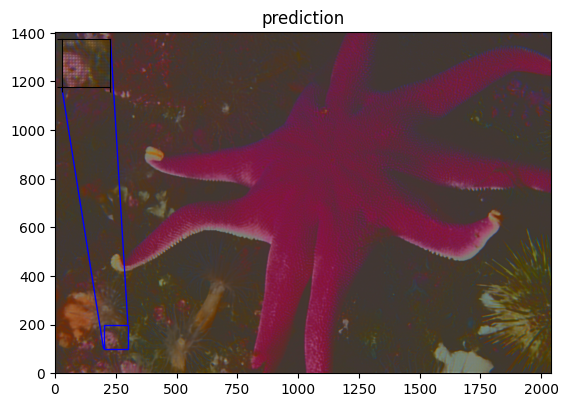

80/80 - 257s - 3s/step - loss: 59776.6484 - mean_squared_error: 0.0290 - val_loss: 72906.9297 - val_mean_squared_error: 0.0615 - learning_rate: 0.0097
Epoch 2/250
Mean PSNR for epoch: 12.86
80/80 - 277s - 3s/step - loss: 48439.4766 - mean_squared_error: 0.0228 - val_loss: 55183.5234 - val_mean_squared_error: 0.0496 - learning_rate: 0.0097
Epoch 3/250
Mean PSNR for epoch: 13.36
80/80 - 275s - 3s/step - loss: 43464.0508 - mean_squared_error: 0.0184 - val_loss: 50031.5000 - val_mean_squared_error: 0.0444 - learning_rate: 0.0097
Epoch 4/250
Mean PSNR for epoch: 16.63
80/80 - 273s - 3s/step - loss: 41408.4883 - mean_squared_error: 0.0163 - val_loss: 40658.7617 - val_mean_squared_error: 0.0219 - learning_rate: 0.0097
Epoch 5/250
Mean PSNR for epoch: 17.49
80/80 - 272s - 3s/step - loss: 40627.2695 - mean_squared_error: 0.0164 - val_loss: 39102.7734 - val_mean_squared_error: 0.0177 - learning_rate: 0.0097
Epoch 6/250
Mean PSNR for epoch: 17.79
80/80 - 283s - 4s/step - loss: 39537.1406 - mean_s

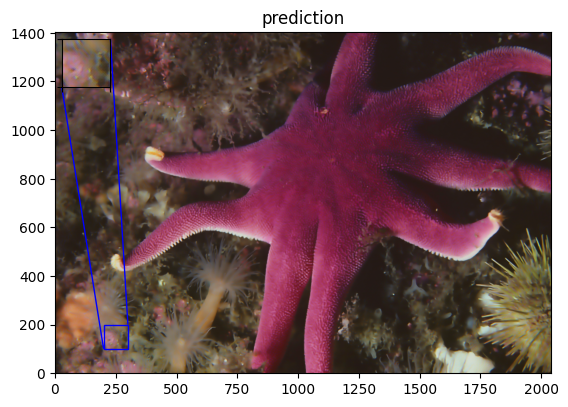

80/80 - 339s - 4s/step - loss: 36141.4141 - mean_squared_error: 0.0157 - val_loss: 33946.8633 - val_mean_squared_error: 0.0122 - learning_rate: 0.0049
Epoch 22/250
Mean PSNR for epoch: 19.50
80/80 - 300s - 4s/step - loss: 35882.9414 - mean_squared_error: 0.0148 - val_loss: 34252.1055 - val_mean_squared_error: 0.0118 - learning_rate: 0.0049
Epoch 23/250
Mean PSNR for epoch: 19.25
80/80 - 274s - 3s/step - loss: 36066.5039 - mean_squared_error: 0.0157 - val_loss: 34741.3086 - val_mean_squared_error: 0.0118 - learning_rate: 0.0049
Epoch 24/250
Mean PSNR for epoch: 19.45
80/80 - 265s - 3s/step - loss: 35784.9688 - mean_squared_error: 0.0149 - val_loss: 33764.6641 - val_mean_squared_error: 0.0121 - learning_rate: 0.0049
Epoch 25/250
Mean PSNR for epoch: 19.03
80/80 - 271s - 3s/step - loss: 35853.3984 - mean_squared_error: 0.0155 - val_loss: 35510.9766 - val_mean_squared_error: 0.0121 - learning_rate: 0.0049
Epoch 26/250
Mean PSNR for epoch: 19.15
80/80 - 266s - 3s/step - loss: 35882.2969 - m

In [120]:
best_model.fit(train_ds, epochs=epochs, callbacks=callbacks, validation_data=valid_ds, verbose=2)

The model weights (that are considered the best) are loaded into the model.

In [121]:
best_model.load_weights(checkpoint_filepath)

## Run model prediction and plot the results
Let's compute the reconstructed version of a few images and save the results.

In [122]:
total_bicubic_psnr = 0.0
total_test_psnr = 0.0

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
PSNR of low resolution image and high resolution image is 25.5413
PSNR of predict and high resolution is 22.1296


/var/folders/8g/3lrn58911zx5zb3l5bh3w7n40000gn/T/ipykernel_13115/1549722598.py:15: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  out_img_y = PIL.Image.fromarray(np.uint8(out_img_y), mode="L")


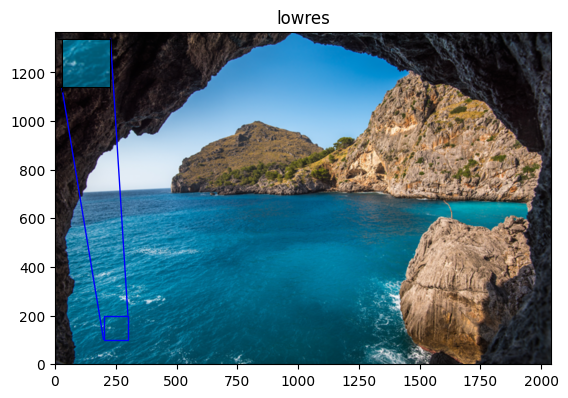

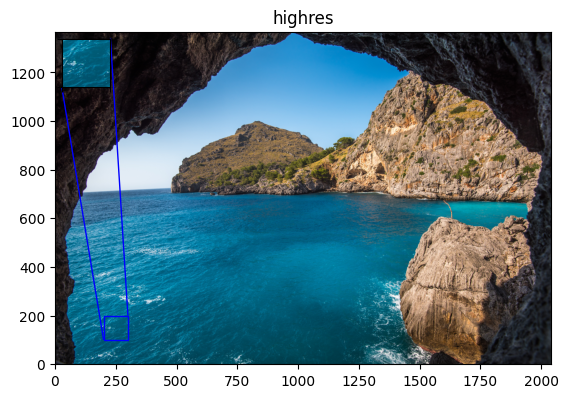

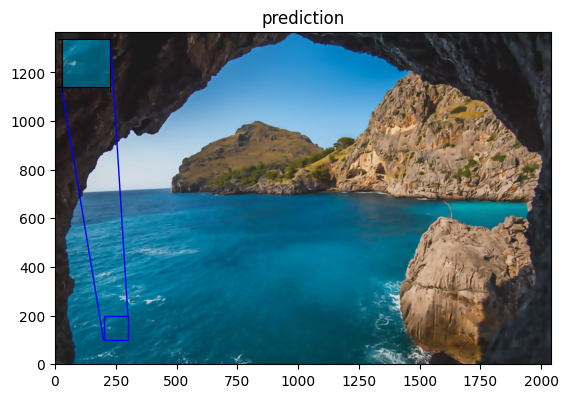

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
PSNR of low resolution image and high resolution image is 23.8124
PSNR of predict and high resolution is 21.0578


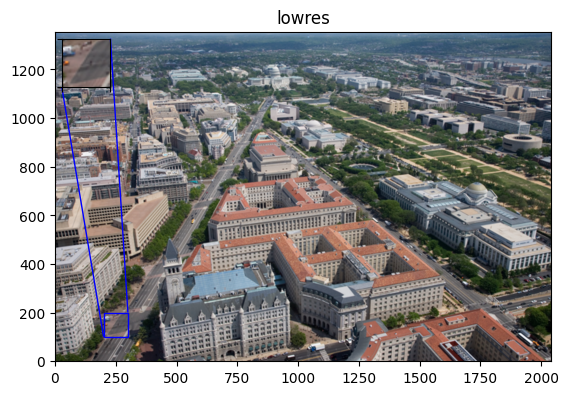

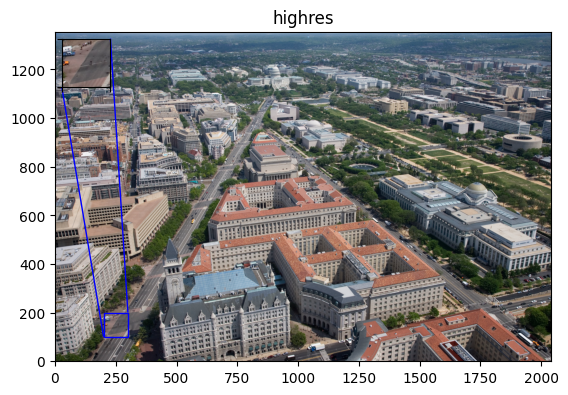

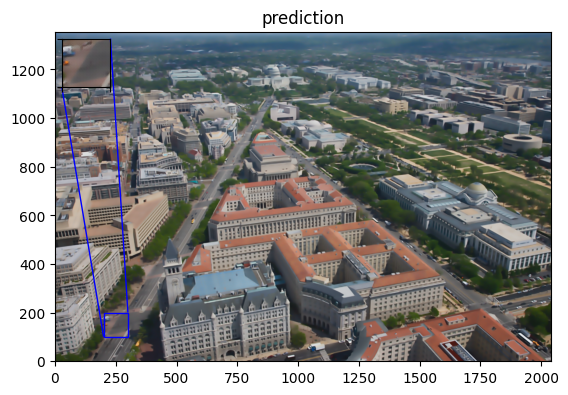

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
PSNR of low resolution image and high resolution image is 27.4719
PSNR of predict and high resolution is 23.4438


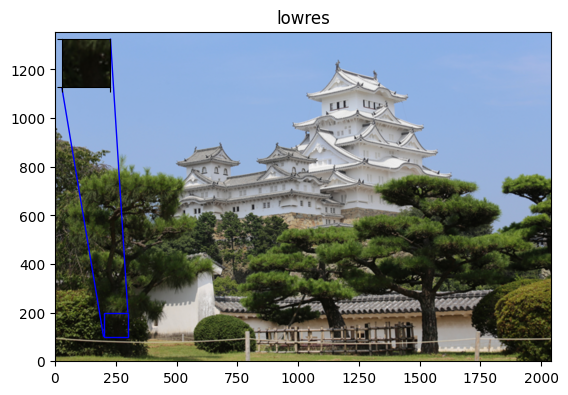

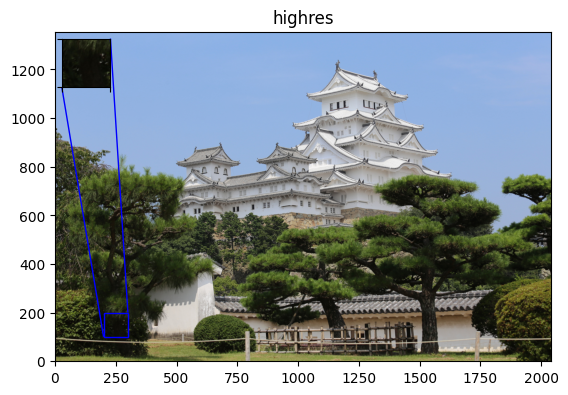

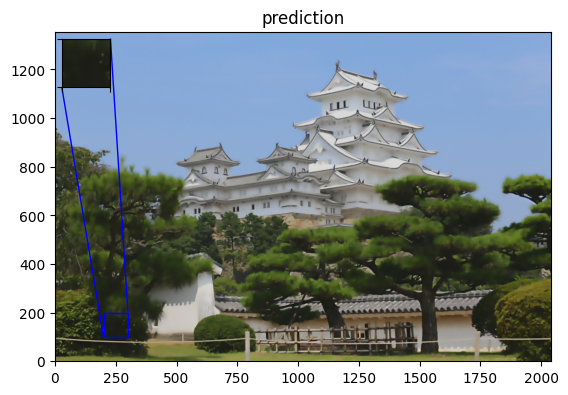

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
PSNR of low resolution image and high resolution image is 25.5005
PSNR of predict and high resolution is 21.7901


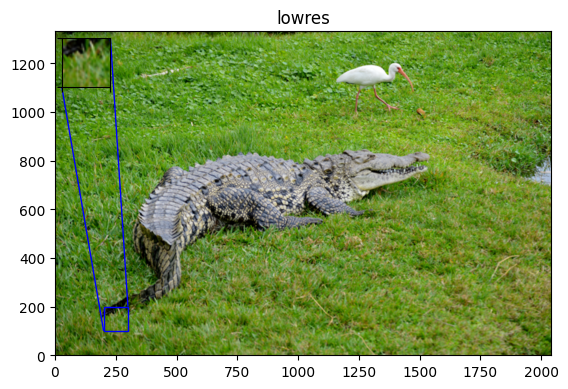

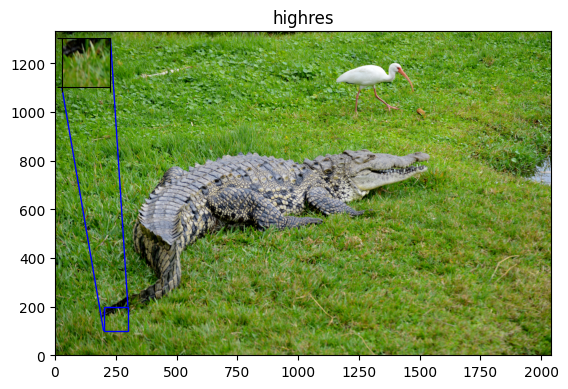

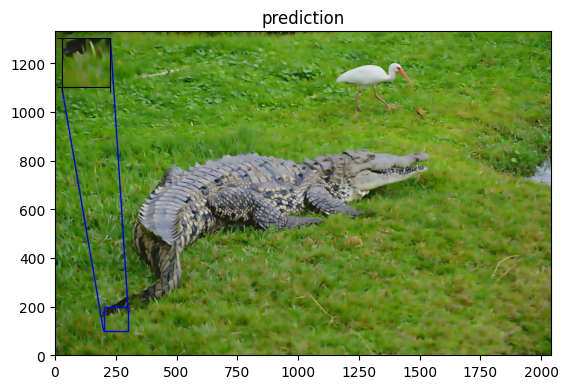

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
PSNR of low resolution image and high resolution image is 35.1242
PSNR of predict and high resolution is 26.0648


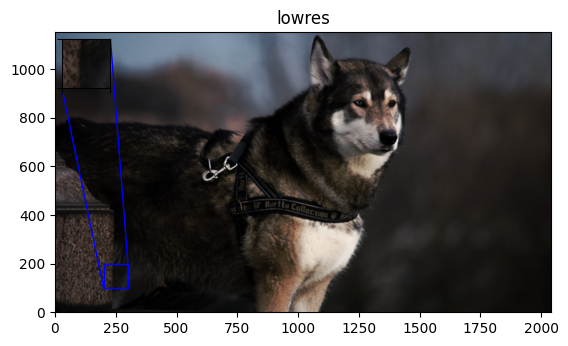

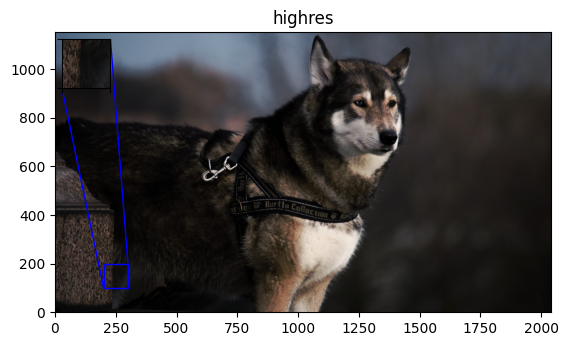

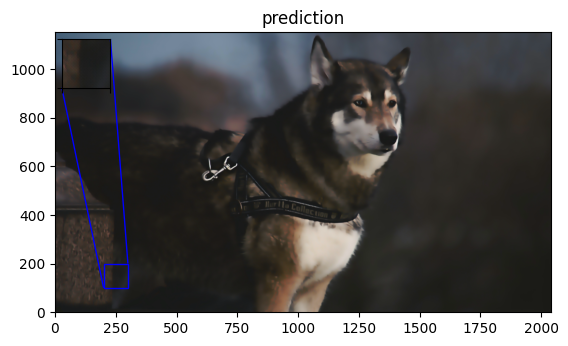

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
PSNR of low resolution image and high resolution image is 24.4946
PSNR of predict and high resolution is 21.9159


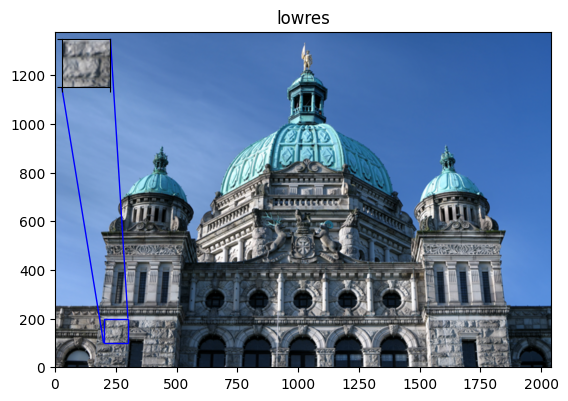

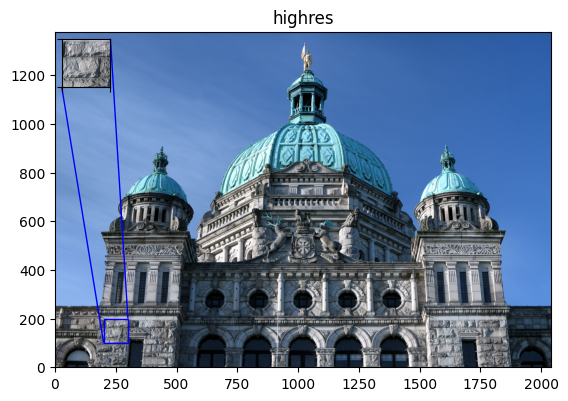

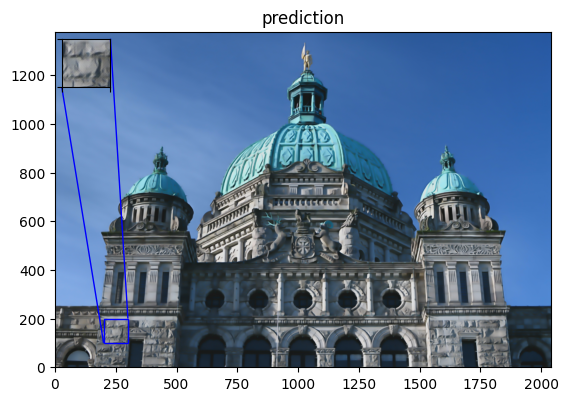

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
PSNR of low resolution image and high resolution image is 30.3212
PSNR of predict and high resolution is 25.5401


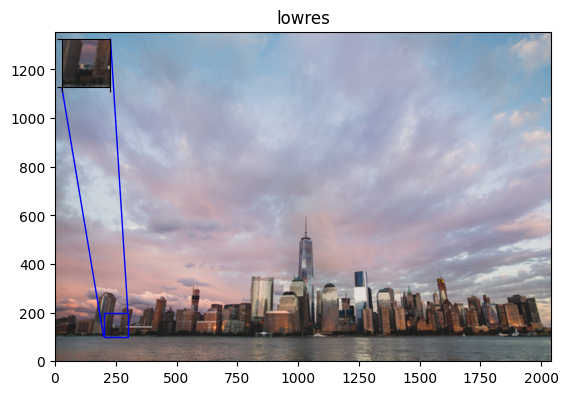

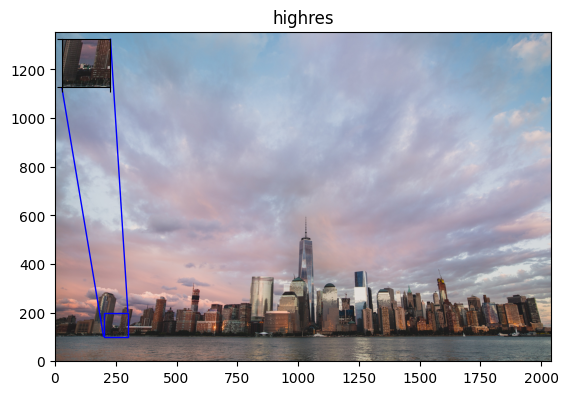

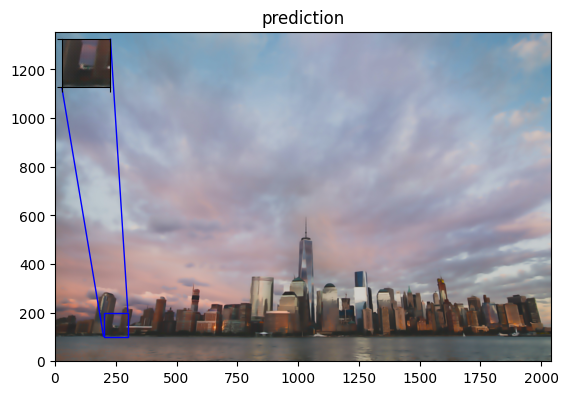

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
PSNR of low resolution image and high resolution image is 33.1812
PSNR of predict and high resolution is 25.7867


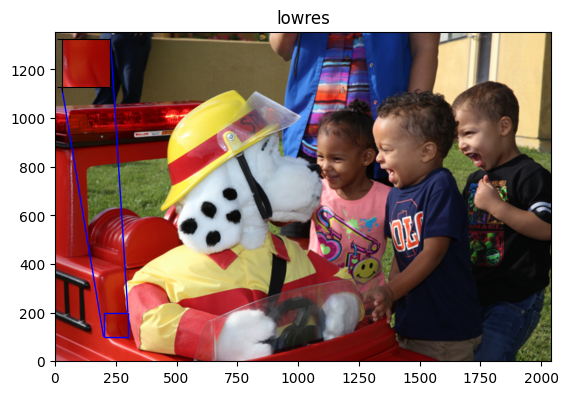

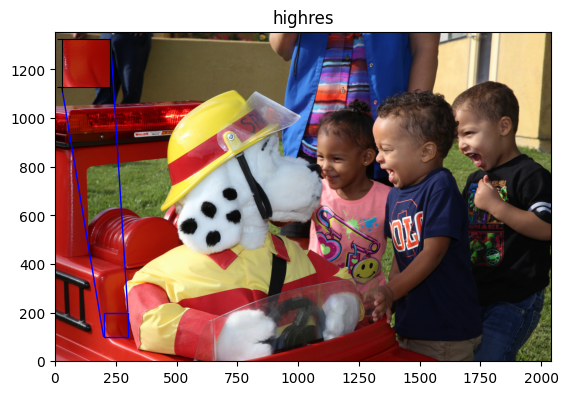

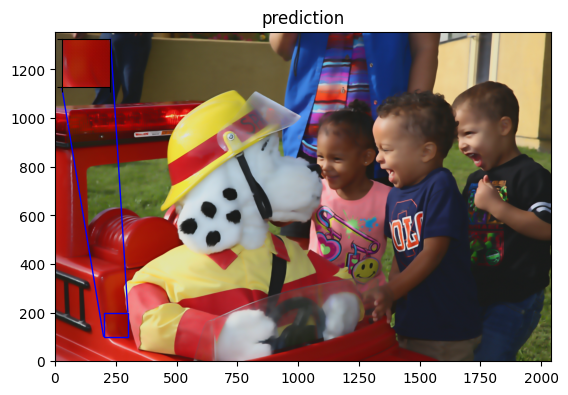

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
PSNR of low resolution image and high resolution image is 31.9881
PSNR of predict and high resolution is 24.9033


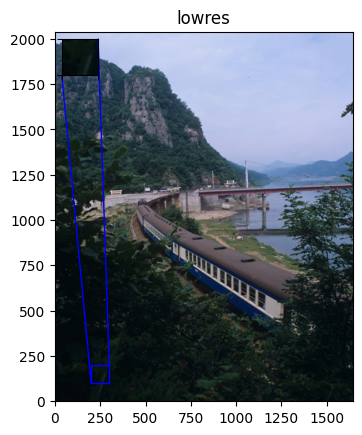

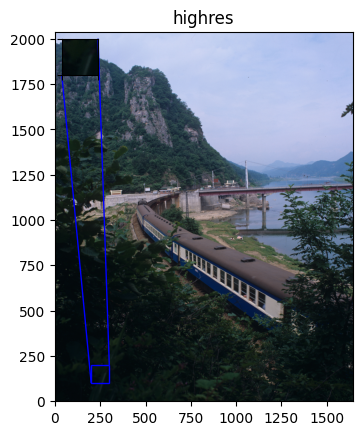

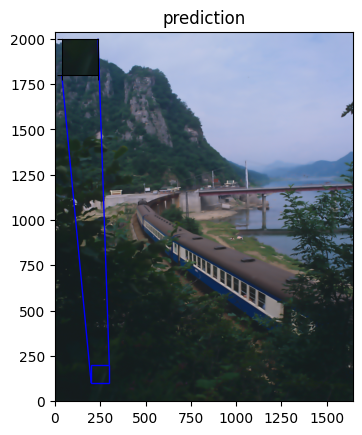

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
PSNR of low resolution image and high resolution image is 24.5394
PSNR of predict and high resolution is 22.2413


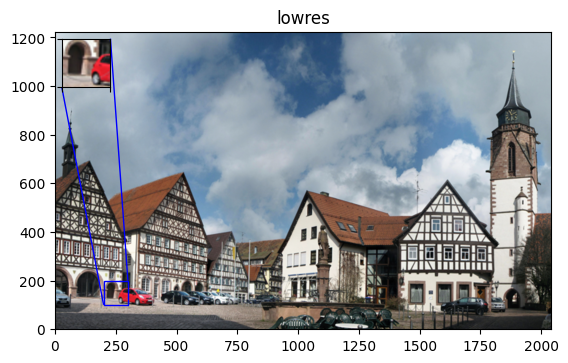

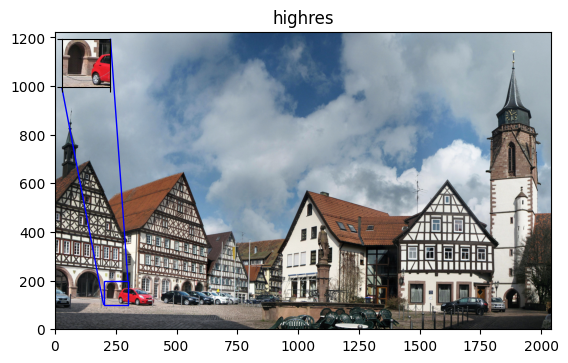

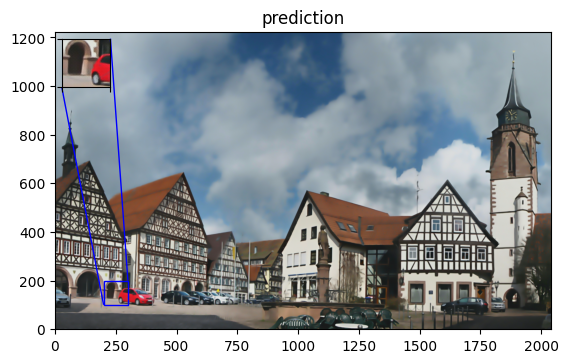

In [123]:
for index, test_img_path in enumerate(test_img_paths[50:60]):
    img = load_img(test_img_path)
    lowres_input = get_lowres_image(img, upscale_factor)
    w = lowres_input.size[0] * upscale_factor
    h = lowres_input.size[1] * upscale_factor
    highres_img = img.resize((w, h))
    # Use best_model instead of model to evaluate the tuned network
    prediction = upscale_image(best_model, lowres_input)
    lowres_img = lowres_input.resize((w, h))
    lowres_img_arr = img_to_array(lowres_img)
    highres_img_arr = img_to_array(highres_img)
    predict_img_arr = img_to_array(prediction)
    bicubic_psnr = tf.image.psnr(lowres_img_arr, highres_img_arr, max_val=255)
    test_psnr = tf.image.psnr(predict_img_arr, highres_img_arr, max_val=255)
    total_bicubic_psnr += bicubic_psnr
    total_test_psnr += test_psnr
    print(
        "PSNR of low resolution image and high resolution image is %.4f" % bicubic_psnr
    )
    print("PSNR of predict and high resolution is %.4f" % test_psnr)
    plot_results(lowres_img, index, "lowres")
    plot_results(highres_img, index, "highres")
    plot_results(prediction, index, "prediction")

In [124]:
print("Avg. PSNR of lowres images is %.4f" % (total_bicubic_psnr / 10))
print("Avg. PSNR of reconstructions is %.4f" % (total_test_psnr / 10))

Avg. PSNR of lowres images is 28.1975
Avg. PSNR of reconstructions is 23.4874
